In [1]:
# mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
# print number of images in the train and test set of the dataset

# print number of images in the train and test set of the dataset
train_path = '/content/drive/MyDrive/plaques/images/train'

train_images = len([name for name in os.listdir(train_path) if os.path.isfile(os.path.join(train_path, name))])
print(f"Number of images in the training set: {train_images}")


Number of images in the training set: 20


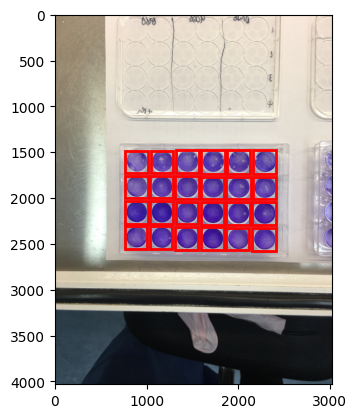

In [3]:
# plot image ID_AWV6yV with corresponding bounding boxe label in the txt file
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def plot_image_with_bboxes(image_path, label_path):
    """
    Plots an image with bounding boxes drawn on it.

    Args:
        image_path (str): Path to the image file.
        label_path (str): Path to the label file containing bounding box coordinates.
    """

    # Read the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Read the labels
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Create figure and axes
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    # Process each bounding box
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])

        # Convert normalized coordinates to pixel coordinates
        img_height, img_width, _ = img.shape
        x_min = int((x_center - width / 2) * img_width)
        y_min = int((y_center - height / 2) * img_height)
        box_width = int(width * img_width)
        box_height = int(height * img_height)

        # Create a Rectangle patch
        rect = patches.Rectangle((x_min, y_min), box_width, box_height, linewidth=2, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()

# Example usage (replace with your file paths)
image_path = '/content/drive/MyDrive/plaques/images/train/2021-05-13_16-31-56_059.jpeg'
label_path = '/content/drive/MyDrive/plaques/labels/train/2021-05-13_16-31-56_059.txt'

plot_image_with_bboxes(image_path, label_path)

In [4]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [5]:
import pandas as pd
import os
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import cv2
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import multiprocessing
import numpy as np
from PIL import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
import os

labels_path = '/content/drive/MyDrive/plaques/labels/train'
empty_count = 0

try:
    if os.path.exists(labels_path) and os.path.isdir(labels_path):
        for filename in os.listdir(labels_path):
            if filename.endswith('.txt'):
                filepath = os.path.join(labels_path, filename)
                try:
                    with open(filepath, 'r') as f:
                        content = f.read().strip()
                        if not content:
                            empty_count += 1
                except Exception as e:
                    print(f"Error reading file {filename}: {e}")
    else:
        print(f"Error: Path not found or not a directory: {labels_path}")

    print(f"Number of empty text files in {labels_path}: {empty_count}")

except Exception as e:
    print(f"An error occurred: {e}")

Number of empty text files in /content/drive/MyDrive/plaques/labels/train: 0


In [7]:
import os

labels_path = '/content/drive/MyDrive/plaques/labels/train'
total_labels = 0

try:
    if os.path.exists(labels_path) and os.path.isdir(labels_path):
        for filename in os.listdir(labels_path):
            if filename.endswith('.txt'):
                filepath = os.path.join(labels_path, filename)
                try:
                    with open(filepath, 'r') as f:
                        lines = f.readlines()
                        total_labels += len(lines)
                except Exception as e:
                    print(f"Error reading file {filename}: {e}")
    else:
        print(f"Error: Path not found or not a directory: {labels_path}")

    print(f"Total number of labels (rows) in {labels_path}: {total_labels}")

except Exception as e:
    print(f"An error occurred: {e}")

Total number of labels (rows) in /content/drive/MyDrive/plaques/labels/train: 416


In [8]:
import os

images_path = '/content/drive/MyDrive/plaques/images/train'  # Replace with your images path
labels_path = '/content/drive/MyDrive/plaques/labels/train'  # Replace with your labels path
deleted_count = 0

try:
    if os.path.exists(images_path) and os.path.isdir(images_path) and os.path.exists(labels_path) and os.path.isdir(labels_path):
        image_files = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]  # Add other image extensions if needed
        label_files = {os.path.splitext(f)[0] for f in os.listdir(labels_path) if f.endswith('.txt')}

        for image_file in image_files:
            image_name_without_ext = os.path.splitext(image_file)[0]
            if image_name_without_ext not in label_files:
                image_path_to_delete = os.path.join(images_path, image_file)
                os.remove(image_path_to_delete)
                deleted_count += 1
                print(f"Deleted unlabeled image: {image_file}")

        print(f"Finished checking. Deleted {deleted_count} unlabeled images.")

    else:
        print("Error: One or both of the image and label paths are invalid.")

except Exception as e:
    print(f"An error occurred: {e}")

Finished checking. Deleted 0 unlabeled images.


In [9]:
import os

images_path = '/content/drive/MyDrive/plaques/images/val'  # Replace with your images path
labels_path = '/content/drive/MyDrive/plaques/labels/val'  # Replace with your labels path
deleted_count = 0

try:
    if os.path.exists(images_path) and os.path.isdir(images_path) and os.path.exists(labels_path) and os.path.isdir(labels_path):
        image_files = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]  # Add other image extensions if needed
        label_files = {os.path.splitext(f)[0] for f in os.listdir(labels_path) if f.endswith('.txt')}

        for image_file in image_files:
            image_name_without_ext = os.path.splitext(image_file)[0]
            if image_name_without_ext not in label_files:
                image_path_to_delete = os.path.join(images_path, image_file)
                os.remove(image_path_to_delete)
                deleted_count += 1
                print(f"Deleted unlabeled image: {image_file}")

        print(f"Finished checking. Deleted {deleted_count} unlabeled images.")

    else:
        print("Error: One or both of the image and label paths are invalid.")

except Exception as e:
    print(f"An error occurred: {e}")

Finished checking. Deleted 0 unlabeled images.


Displaying 2021-05-20_16-23-59_843.jpeg with bounding boxes.


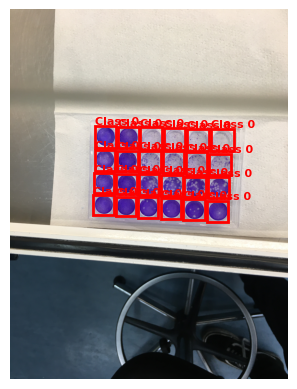

Displaying 2021-05-27_15-42-02_762.jpeg with bounding boxes.


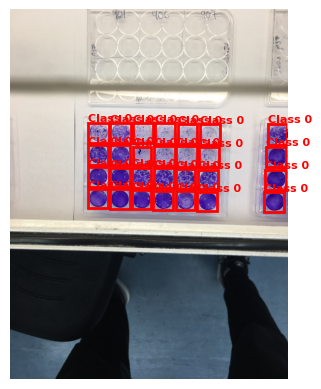

Displaying 2021-07-15_17-00-01_641.jpeg with bounding boxes.


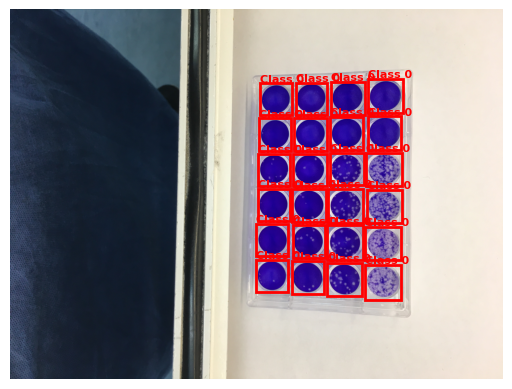

In [10]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import random
from pathlib import Path

def plot_image_with_bboxes(image_path, label_path):
    """
    Plots an image with bounding boxes drawn on it and displays it.

    Args:
        image_path (str): Path to the image file.
        label_path (str): Path to the label file containing bounding box coordinates.
    """

    # Read the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for matplotlib

    # Read the labels
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Create figure and axes
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    # Process each bounding box
    for line in lines:
        parts = line.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])

        # Convert normalized coordinates to pixel coordinates
        img_height, img_width, _ = img.shape
        x_min = int((x_center - width / 2) * img_width)
        y_min = int((y_center - height / 2) * img_height)
        box_width = int(width * img_width)
        box_height = int(height * img_height)

        # Create a Rectangle patch
        rect = patches.Rectangle((x_min, y_min), box_width, box_height, linewidth=2, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)
        plt.text(x_min, y_min - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')  # Turn off axis labels and ticks
    plt.show()

def display_random_images_with_bboxes(image_dir, label_dir, num_images=3):
    """
    Displays a specified number of random images with their bounding boxes.

    Args:
        image_dir (str): Path to the directory containing the images.
        label_dir (str): Path to the directory containing the label files.
        num_images (int): The number of images to display.
    """

    image_dir_path = Path(image_dir)
    label_dir_path = Path(label_dir)

    # Get list of image files
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if not image_files:
        print(f"No images found in {image_dir}")
        return

    # Sample a random subset of images
    if num_images > len(image_files):
        num_images = len(image_files) # adjust if num_images is greater than the number of images
    selected_images = random.sample(image_files, num_images)

    for image_name in selected_images:
        image_path = image_dir_path / image_name
        img_ext = image_name.split('.')[-1]
        label_path = label_dir_path / (image_name.replace(f'.{img_ext}', '.txt'))

        if label_path.exists():
            print(f"Displaying {image_name} with bounding boxes.")
            plot_image_with_bboxes(str(image_path), str(label_path))
        else:
            print(f"No annotations found for {image_name}.")

# Example usage
image_directory = '/content/drive/MyDrive/plaques/images/train'
label_directory = '/content/drive/MyDrive/plaques/labels/train'

display_random_images_with_bboxes(image_directory, label_directory, num_images=3)

# Data augmentations#

In [11]:
from pathlib import Path
import os
import cv2
import numpy as np
from tqdm import tqdm
import albumentations as A

def augment_image_and_label(image_path, label_path, output_image_dir, output_label_dir, augment, output_image_name, output_label_name):
    """
    Applies augmentations to a single image and its corresponding YOLO-format label file.

    Args:
        image_path (Path): Path to the input image.
        label_path (Path): Path to the input label file.
        output_image_dir (Path): Directory to save the augmented image.
        output_label_dir (Path): Directory to save the augmented label file.
        augment (A.Compose): Albumentations Compose object defining the augmentation pipeline.
        output_image_name (str): Name to use when saving augmented image
        output_label_name (str): Name to use when saving augmented label
    Returns:
        bool: True if augmentation was successful, False otherwise.
    """

    try:
        image = cv2.imread(str(image_path))
        if image is None:
            print(f"Warning: Could not read image: {image_path}")
            return False
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    except Exception as e:
        print(f"Error reading image: {image_path}, {e}")
        return False

    bboxes = []
    category_ids = []

    if label_path.exists():
        try:
            with open(str(label_path), 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    try:
                        category_id = int(parts[0])
                        bbox = list(map(float, parts[1:]))
                        bboxes.append(bbox)
                        category_ids.append(category_id)

                    except ValueError:
                        print(f"Error reading label in {label_path}: {line}")
                        return False
        except FileNotFoundError:
            print(f"Warning: Label file not found: {label_path}")
            return False
    else:
        print(f"Warning: Label file not found: {label_path}")
        return False

    transformed = augment(image=image, bboxes=bboxes, category_ids=category_ids)
    transformed_image = transformed['image']
    transformed_bboxes = transformed['bboxes']
    transformed_category_ids = transformed['category_ids']

    output_image_path = output_image_dir / output_image_name
    output_label_path = output_label_dir / output_label_name

    try:
        cv2.imwrite(str(output_image_path), cv2.cvtColor(transformed_image, cv2.COLOR_RGB2BGR))  # Save the augmented image!
    except Exception as e:
        print(f"Error writing image: {output_image_path}, {e}")
        return False

    try:
        with open(str(output_label_path), 'w') as f:
            for bbox, category_id in zip(transformed_bboxes, transformed_category_ids):
                if len(bbox) == 4:
                    # Clamp and round coordinates to be extra safe
                    bbox = [max(0.0, min(1.0, coord)) for coord in bbox]  # Clamp values to [0.0, 1.0]
                    bbox = [round(coord, 6) for coord in bbox]
                    line = f"{category_id} " + " ".join(map(str, bbox)) + "\n"
                    f.write(line)
    except Exception as e:
        print(f"Error writing label file: {output_label_path}, {e}")
        return False

    return True


def create_augmentation_transform():
    """Create a composition of augmentations to apply."""
    transform = A.Compose(
        [
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
            A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.5),
            A.Blur(blur_limit=3, p=0.2),
            A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),
            # A.RandomRotate90(p=0.2), # Consider carefully
        ],
        bbox_params=A.BboxParams(format='yolo', label_fields=['category_ids'], clip= True),
    )
    return transform

# --- Main Script ---
if __name__ == "__main__":
    ORIGINAL_IMAGES_DIR = Path('/content/drive/MyDrive/plaques/images/train')
    ORIGINAL_LABELS_DIR = Path('/content/drive/MyDrive/plaques/labels/train')
    OUTPUT_DIR = Path('/content/augmented_dataset')
    OUTPUT_IMAGES_DIR = Path('/content/drive/MyDrive/plaques/images/augmented')
    OUTPUT_LABELS_DIR = Path('/content/drive/MyDrive/plaques/labels/augmented')
    IMG_SIZE = 640  # Adjust as needed
    NUM_AUGMENTATIONS_PER_IMAGE = 5  # Generate 5 augmented versions per original

    # Create output directories
    OUTPUT_IMAGES_DIR.mkdir(parents=True, exist_ok=True)
    OUTPUT_LABELS_DIR.mkdir(parents=True, exist_ok=True)

    # Create augmentation transform
    augment = create_augmentation_transform()

    # Get list of images
    image_files = [
        f for f in os.listdir(ORIGINAL_IMAGES_DIR)
        if f.lower().endswith(('.jpg', '.jpeg'))
    ]

    # Process each image and label
    print("Applying augmentations...")
    for image_file in tqdm(image_files):
        image_path = ORIGINAL_IMAGES_DIR / image_file
        label_path = ORIGINAL_LABELS_DIR / image_file.replace(image_file.split('.')[-1], 'txt')

        for i in range(NUM_AUGMENTATIONS_PER_IMAGE):
            output_image_name = f"aug_{i}_{image_file}"
            output_label_name = f"aug_{i}_{image_file.replace(image_file.split('.')[-1], 'txt')}"
            augment_image_and_label(
                image_path,
                label_path,
                OUTPUT_IMAGES_DIR,
                OUTPUT_LABELS_DIR,
                augment,
                output_image_name=output_image_name, # Pass custom output names
                output_label_name=output_label_name
            )

    print("Augmentation process complete.")

<ipython-input-11-d7940f3c1f24>:96: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.2),


Applying augmentations...


100%|██████████| 20/20 [02:07<00:00,  6.40s/it]

Augmentation process complete.


Plotting aug_0_2021-05-13_16-31-56_059.jpeg with 24 bounding boxes.


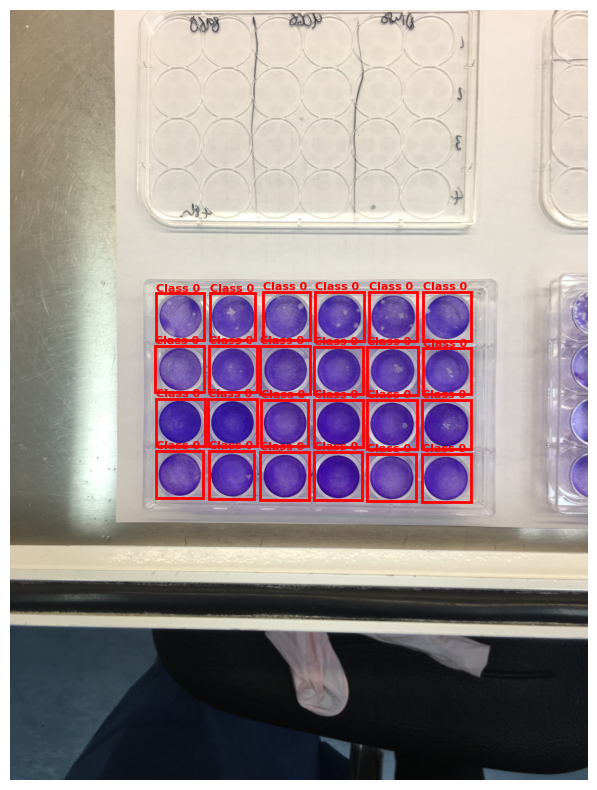

Plotting aug_1_2021-05-13_16-31-56_059.jpeg with 24 bounding boxes.


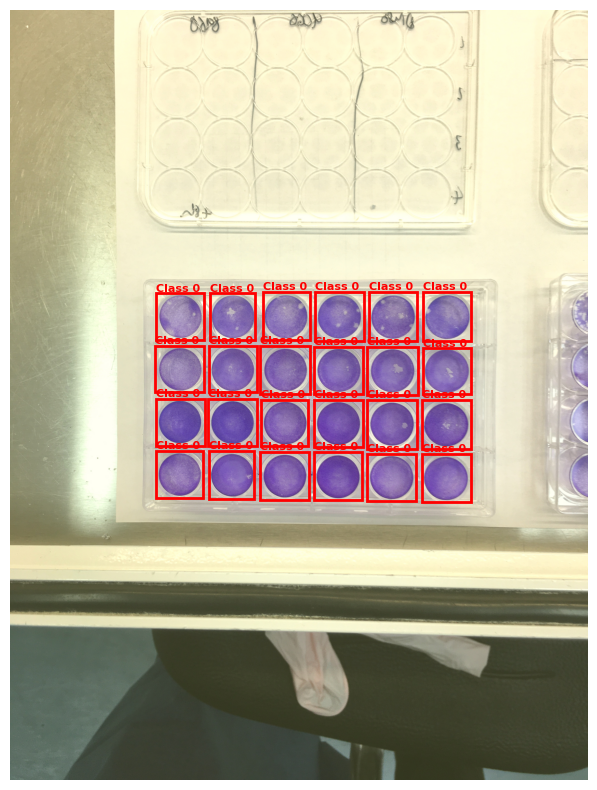

Plotting aug_2_2021-05-13_16-31-56_059.jpeg with 24 bounding boxes.


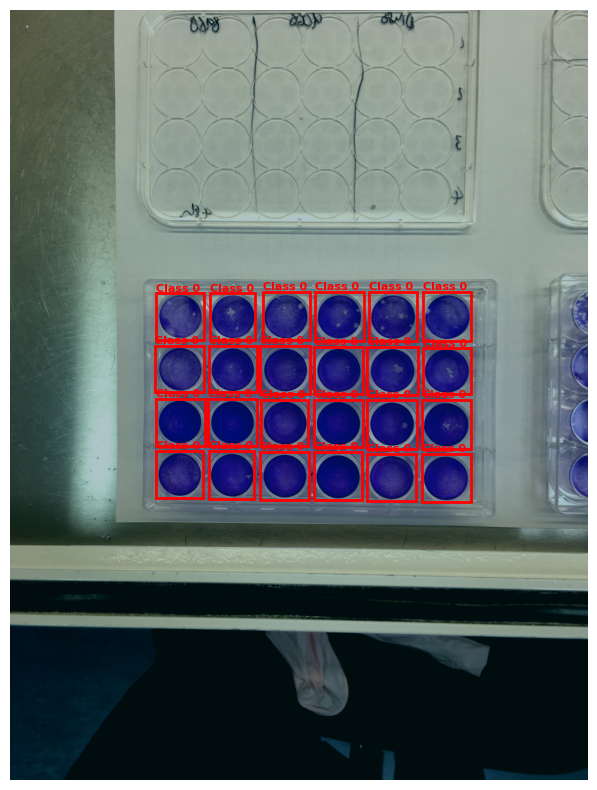

Plotting aug_3_2021-05-13_16-31-56_059.jpeg with 24 bounding boxes.


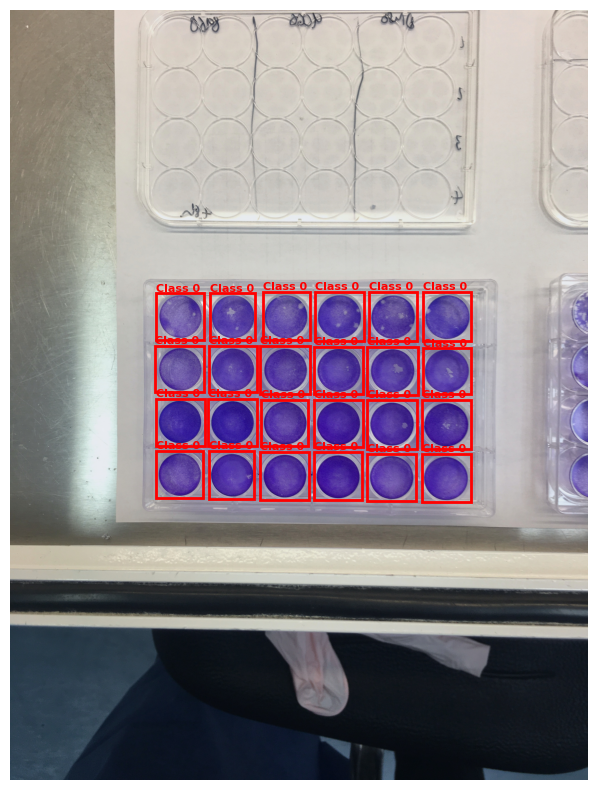

Plotting aug_4_2021-05-13_16-31-56_059.jpeg with 24 bounding boxes.


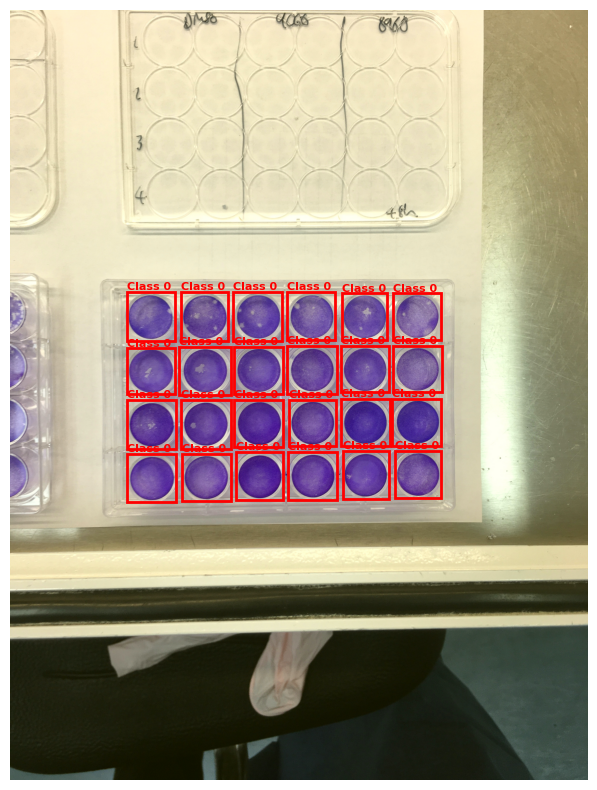

In [12]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = Path('/content/drive/MyDrive/plaques/images/augmented')
LABEL_DIR = Path('/content/drive/MyDrive/plaques/labels/augmented')

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    img_ext = image_name.split('.')[-1]
    label_path = LABEL_DIR / (image_name.replace(f'.{img_ext}', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)
    else:
        print(f"No annotations found for {image_name}.")

In [13]:
model = YOLO("yolo11m.pt")

100%|██████████| 38.8M/38.8M [00:00<00:00, 274MB/s]


In [14]:
# Directories for images and labels
TRAIN_IMAGES_DIR = '/content/drive/MyDrive/plaques/images/augmented'
TRAIN_LABELS_DIR = '/content/drive/MyDrive/plaques/labels/augmented'
VAL_IMAGES_DIR = '/content/drive/MyDrive/plaques/images/val'
VAL_LABELS_DIR = '/content/drive/MyDrive/plaques/labels/val'
TEST_IMAGES_DIR = '/content/drive/MyDrive/plaques/images/test'


# Define class names and number of classes based on your data
class_names = ['well']  # Assuming your class is 'plaque' (you can adjust this)
num_classes = len(class_names)

In [15]:
data_yaml_ab = {
    'path': '/content', # Add a path here
    'train': str(Path(TRAIN_IMAGES_DIR).absolute()),
    'val': str(Path(VAL_IMAGES_DIR).absolute()),
    'test': str(Path(TEST_IMAGES_DIR).absolute()),
    'nc': num_classes,
    'names': class_names
}

In [16]:
yaml_path = 'data_aug.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml_ab, file, default_flow_style=False)

# Preview data yaml file
data_yaml_ab

{'path': '/content',
 'train': '/content/drive/MyDrive/plaques/images/augmented',
 'val': '/content/drive/MyDrive/plaques/images/val',
 'test': '/content/drive/MyDrive/plaques/images/test',
 'nc': 1,
 'names': ['well']}

In [17]:
model.train(
    data='/content/data_aug.yaml',
    epochs=30,
    imgsz=1024,
    batch=8,
    device=0,
    patience=5)

Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data_aug.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, perspective=0.0, plots=True, pose=12.0, pretrained=True,

100%|██████████| 755k/755k [00:00<00:00, 20.4MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

 13                  -1  1   1642496  ultralytics.nn.modules.block.C3k2            [1024, 512, 1, True]          
 14                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 15             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 16                  -1  1    542720  ultralytics.nn.modules.block.C3k2            [1024, 256, 1, True]          
 17                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 18            [-1, 13]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 19                  -1  1   1511424  ultralytics.nn.modules.block.C3k2            [768, 512, 1, True]           
 20                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
 21            [-1, 10]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

100%|██████████| 5.35M/5.35M [00:00<00:00, 17.4MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.3±0.1 ms, read: 465.3±116.9 MB/s, size: 4131.7 KB)


train: Scanning /content/drive/MyDrive/plaques/labels/augmented... 100 images, 0 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<00:00, 117.00it/s]

train: New cache created: /content/drive/MyDrive/plaques/labels/augmented.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 7.9±1.5 MB/s, size: 4429.6 KB)


val: Scanning /content/drive/MyDrive/plaques/labels/val.cache... 12 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12/12 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      10.3G     0.8972      2.256     0.9868        111       1024: 100%|██████████| 13/13 [00:18<00:00,  1.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.98s/it]

                   all         12        203      0.902          1      0.984      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      10.3G     0.6464     0.5612     0.8656         65       1024: 100%|██████████| 13/13 [00:08<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         12        203      0.543      0.783      0.546      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      10.4G     0.6065     0.5486     0.8695        179       1024: 100%|██████████| 13/13 [00:09<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

                   all         12        203      0.699          1      0.833       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      10.3G     0.6287     0.4483     0.8598        103       1024: 100%|██████████| 13/13 [00:08<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

                   all         12        203    0.00417     0.0739    0.00227    0.00187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      10.2G     0.5825     0.4715     0.8663        140       1024: 100%|██████████| 13/13 [00:09<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         12        203      0.917          1      0.985       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      10.2G     0.6592      0.452     0.8718        130       1024: 100%|██████████| 13/13 [00:09<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         12        203       0.93          1      0.986      0.813
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 1, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



6 epochs completed in 0.024 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 40.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 40.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


                   all         12        203      0.902          1      0.976      0.831
Speed: 0.4ms preprocess, 19.4ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ffa700cb310>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

#evaluate on test set#


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125554.jpg: 1024x768 28 wells, 67.9ms
Speed: 6.7ms preprocess, 67.9ms inference, 1.8ms postprocess per image at shape (1, 3, 1024, 768)


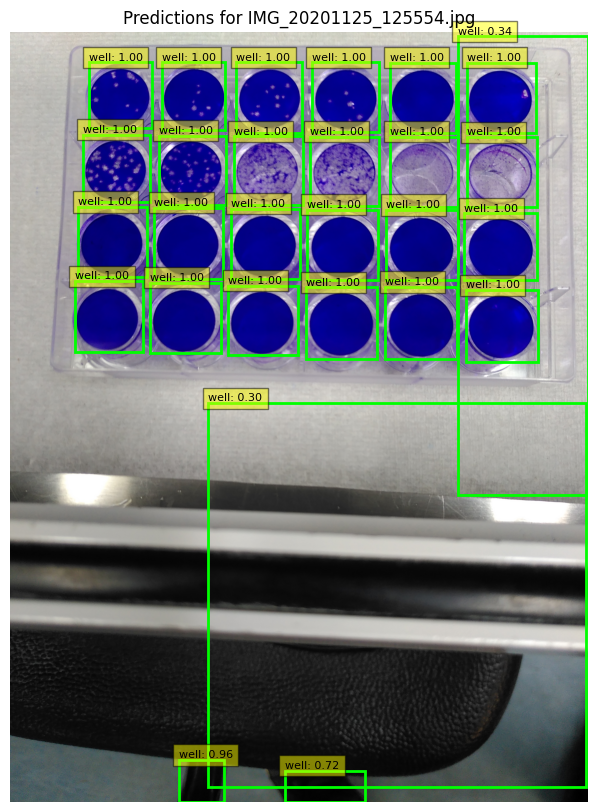


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131341.jpg: 1024x768 17 wells, 65.7ms
Speed: 6.9ms preprocess, 65.7ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 768)


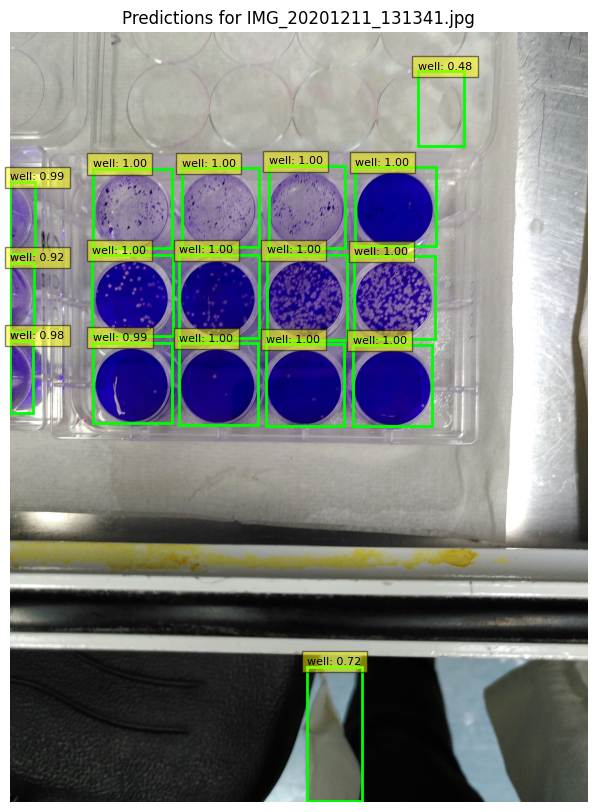


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201119_141652.jpg: 1024x768 44 wells, 65.6ms
Speed: 7.1ms preprocess, 65.6ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 768)


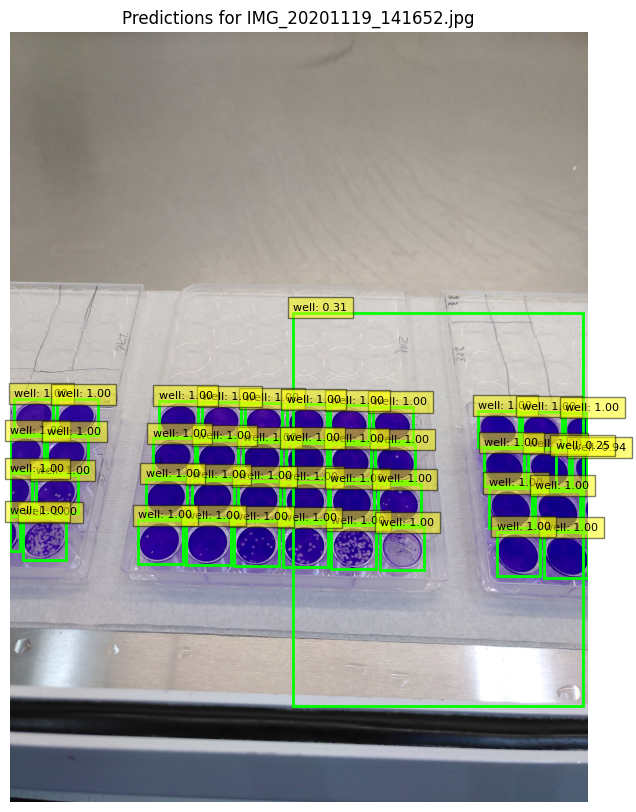


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131332.jpg: 1024x768 30 wells, 65.7ms
Speed: 10.3ms preprocess, 65.7ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 768)


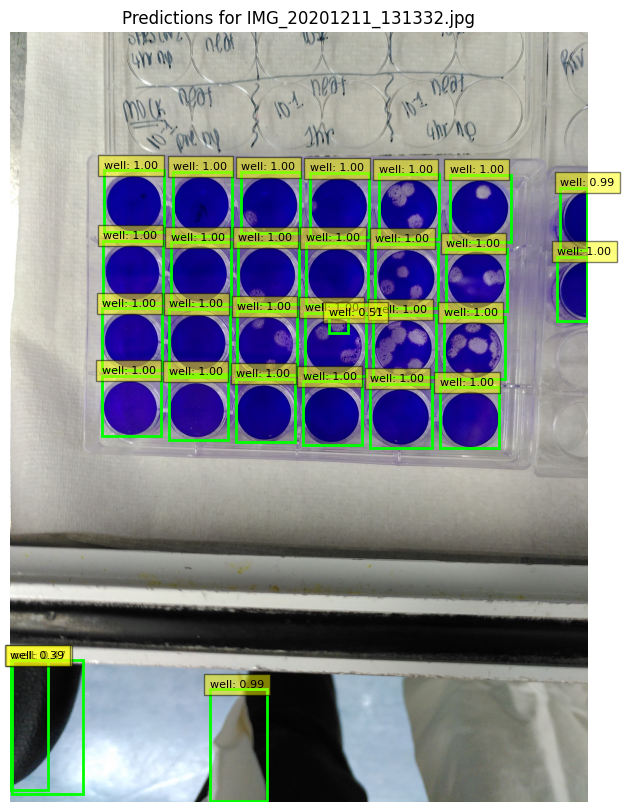


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125622.jpg: 1024x768 15 wells, 65.6ms
Speed: 6.7ms preprocess, 65.6ms inference, 1.8ms postprocess per image at shape (1, 3, 1024, 768)


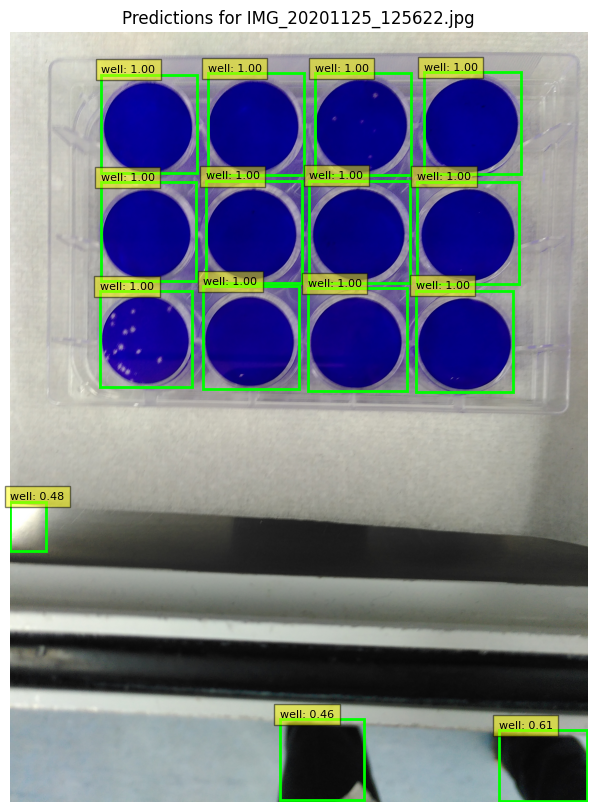


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131353.jpg: 1024x768 19 wells, 65.6ms
Speed: 6.9ms preprocess, 65.6ms inference, 2.5ms postprocess per image at shape (1, 3, 1024, 768)


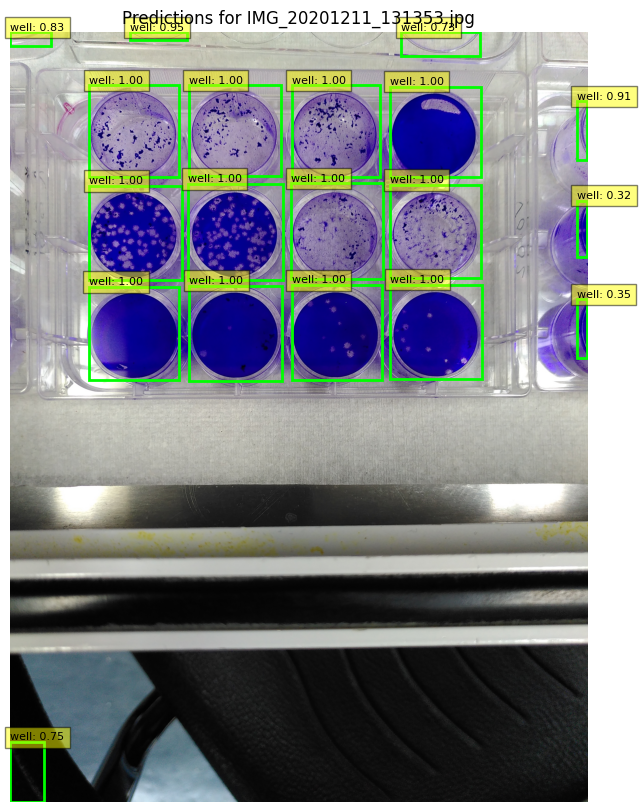


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125548.jpg: 1024x768 24 wells, 65.6ms
Speed: 7.0ms preprocess, 65.6ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 768)


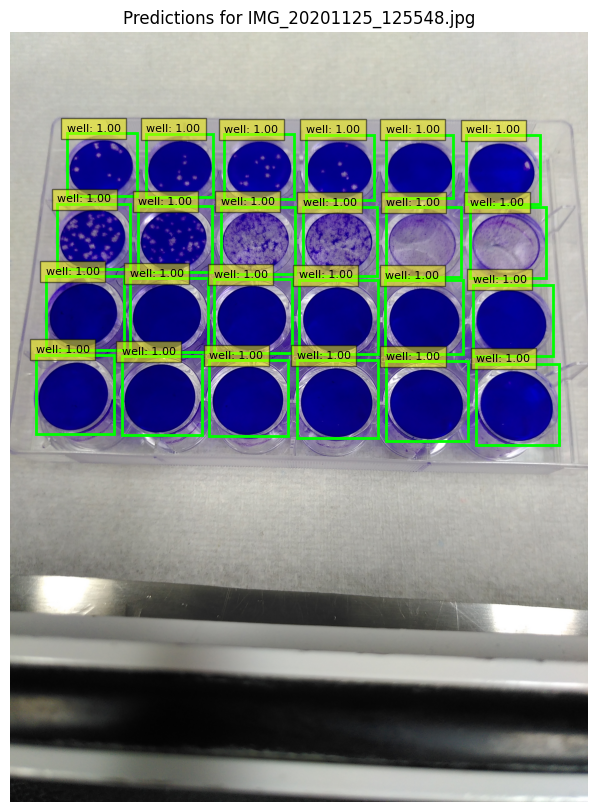


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201119_141656.jpg: 1024x768 37 wells, 65.6ms
Speed: 6.8ms preprocess, 65.6ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)


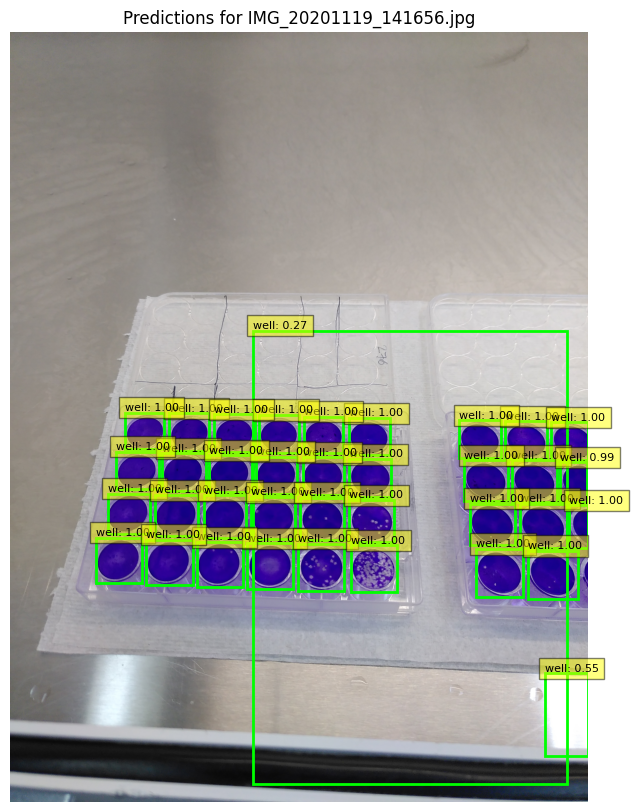


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125539.jpg: 1024x768 16 wells, 65.7ms
Speed: 7.0ms preprocess, 65.7ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)


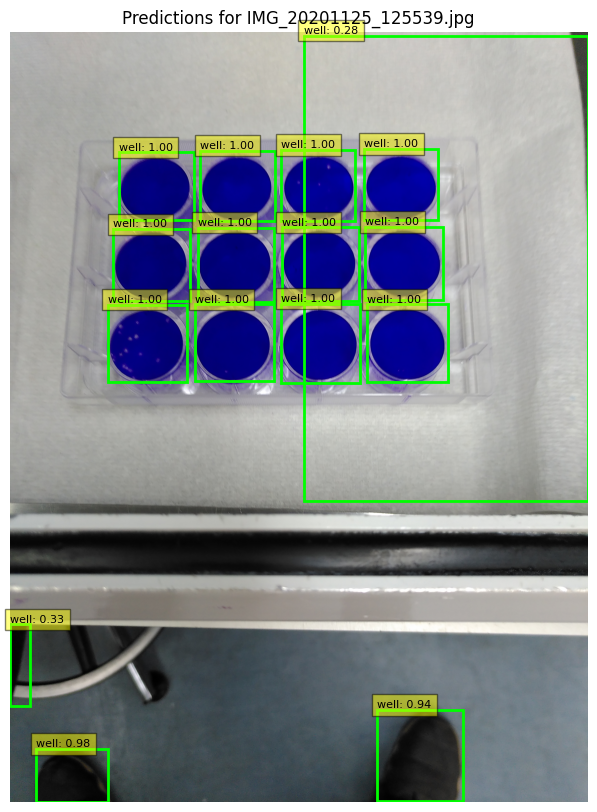


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131348.jpg: 1024x768 19 wells, 65.7ms
Speed: 10.7ms preprocess, 65.7ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 768)


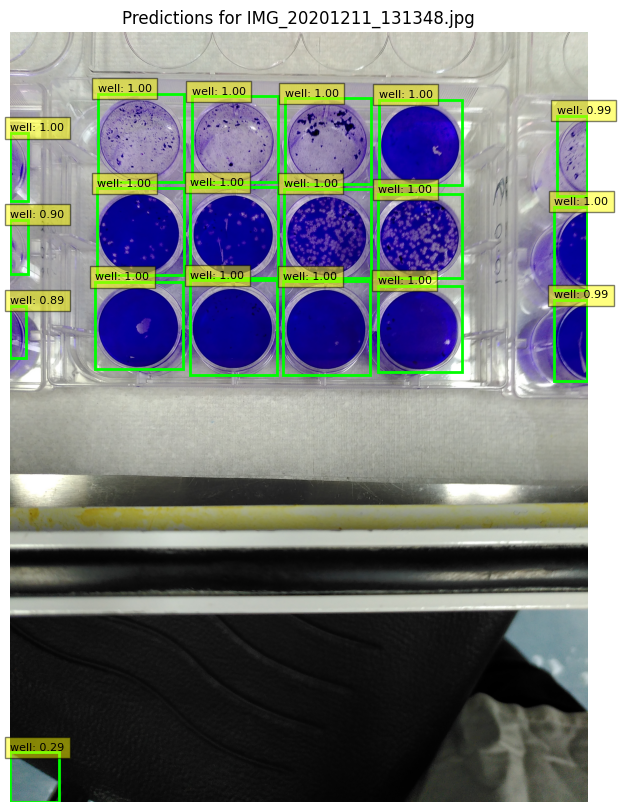


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125543.jpg: 1024x768 13 wells, 65.6ms
Speed: 7.0ms preprocess, 65.6ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)


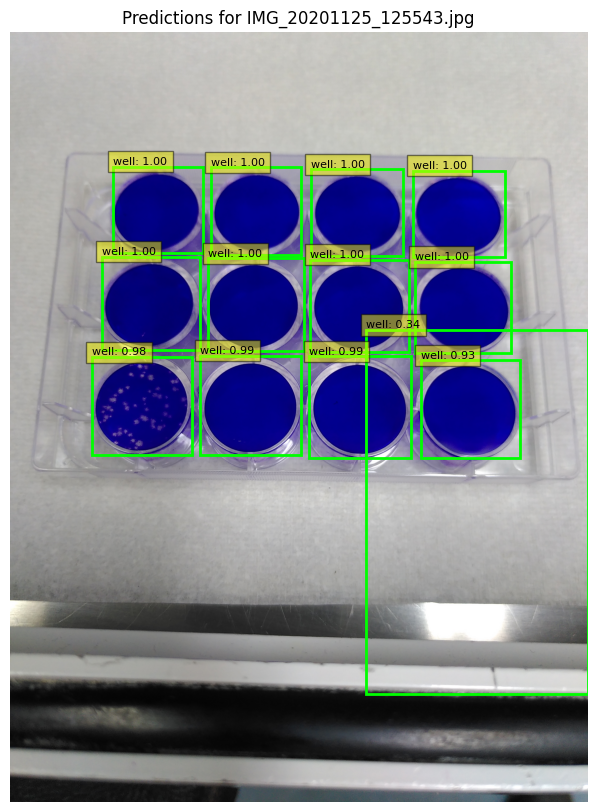


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125621.jpg: 1024x768 14 wells, 65.6ms
Speed: 6.8ms preprocess, 65.6ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 768)


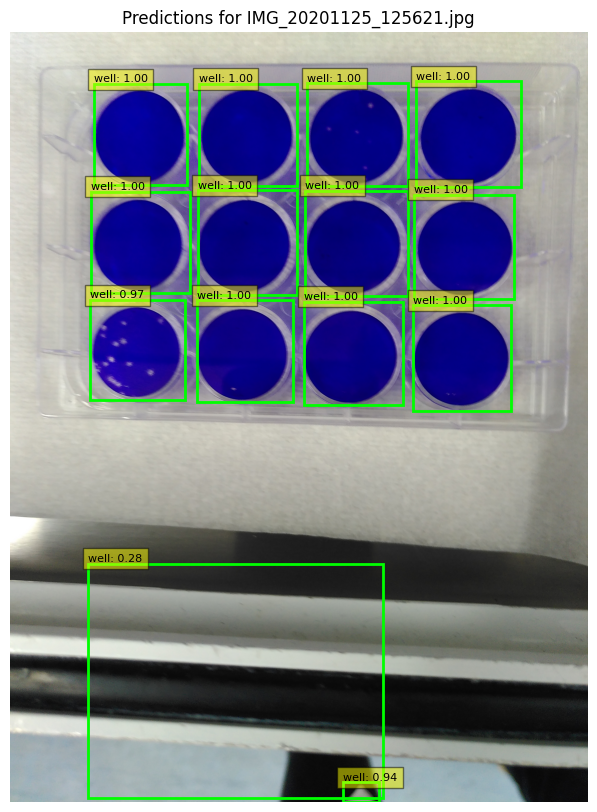


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125603.jpg: 1024x768 14 wells, 65.6ms
Speed: 6.9ms preprocess, 65.6ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 768)


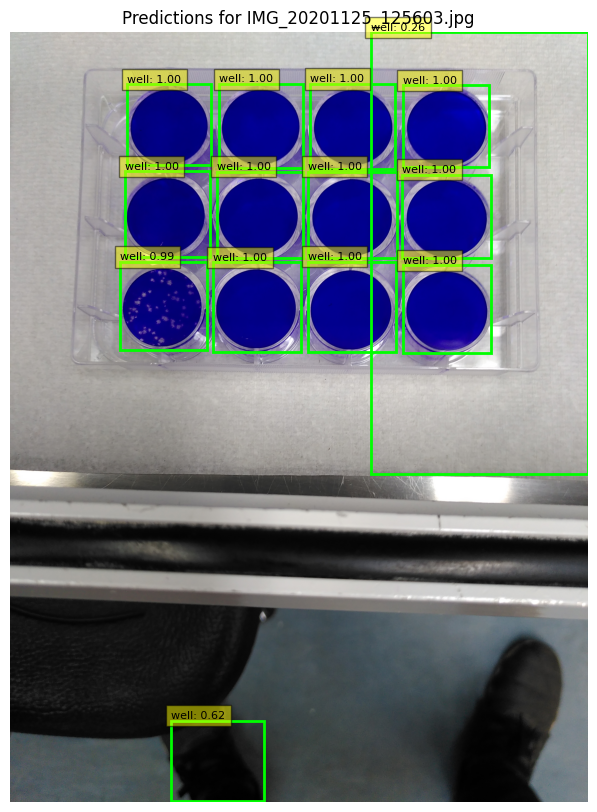


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131325_.jpg: 1024x768 29 wells, 65.7ms
Speed: 6.8ms preprocess, 65.7ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)


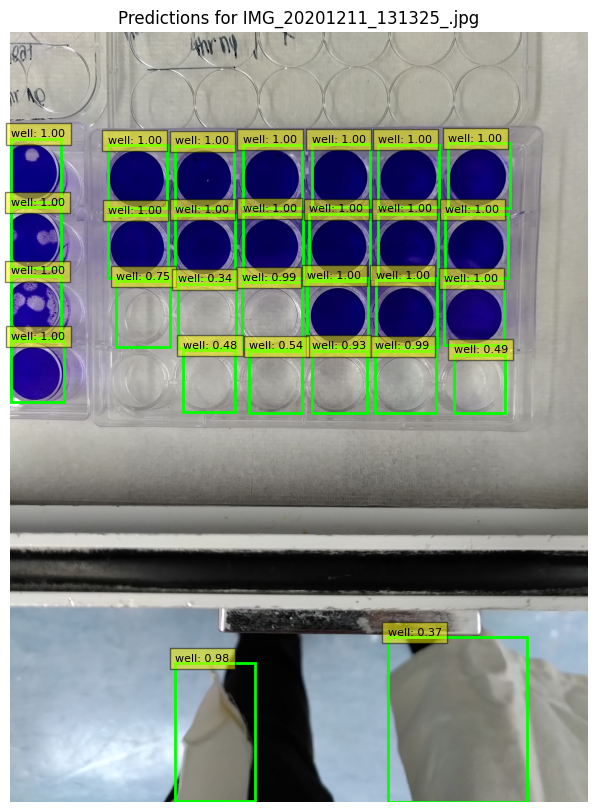


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201211_131409.jpg: 1024x768 15 wells, 65.7ms
Speed: 10.4ms preprocess, 65.7ms inference, 2.6ms postprocess per image at shape (1, 3, 1024, 768)


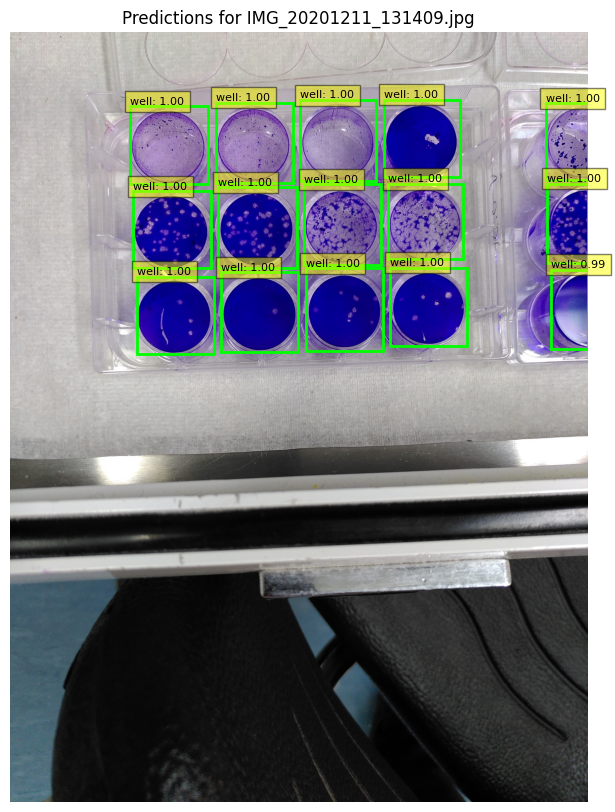

Prediction and display on test set complete.


In [18]:
from ultralytics import YOLO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
import os

# Load your trained model (replace with the path to your best.pt or last.pt file)
trained_model = YOLO('/content/runs/detect/train/weights/best.pt')  # Or 'last.pt'

# Directory containing your test images
TEST_IMAGES_DIR = Path('/content/drive/MyDrive/plaques/images/test')

# Get a list of test image files
test_image_files = [f for f in os.listdir(TEST_IMAGES_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

for image_file in test_image_files:
    image_path = str(TEST_IMAGES_DIR / image_file)

    # Perform prediction
    results = trained_model.predict(source=image_path, save=False, show=False)

    # Process and plot the results
    if results and results[0].boxes:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        classes = results[0].boxes.cls.cpu().numpy().astype(int)

        try:
            img = np.array(Image.open(image_path).convert('RGB'))
            fig, ax = plt.subplots(1, figsize=(10, 10))
            ax.imshow(img)

            for i, box in enumerate(boxes):
                x_min, y_min, x_max, y_max = map(int, box)
                confidence = confidences[i]
                class_id = classes[i]
                class_name = trained_model.names[class_id]

                rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                         linewidth=2, edgecolor='lime', facecolor='none')
                ax.add_patch(rect)
                ax.text(x_min, y_min - 10, f'{class_name}: {confidence:.2f}',
                        bbox=dict(facecolor='yellow', alpha=0.5), fontsize=8, color='black')

            plt.axis('off')
            plt.title(f"Predictions for {image_file}")
            plt.show()
            plt.close(fig)  # Close the figure to free up memory

        except Exception as e:
            print(f"Error processing image {image_file}: {e}")
    else:
        print(f"No objects detected in {image_file}")

print("Prediction and display on test set complete.")

In [19]:
from ultralytics import YOLO
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
import os

# Load your trained model (replace with the path to your best.pt or last.pt file)
trained_model = YOLO('/content/runs/detect/train/weights/best.pt')  # Or 'last.pt'

# Directory containing your test images
TEST_IMAGES_DIR = Path('/content/drive/MyDrive/plaques/images/test')
OUTPUT_CROPPED_DIR = Path('/content/runs/detect/cropped_wells')
OUTPUT_CROPPED_DIR.mkdir(parents=True, exist_ok=True)

# Get a list of test image files
test_image_files = [f for f in os.listdir(TEST_IMAGES_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

for image_file in test_image_files:
    image_path = str(TEST_IMAGES_DIR / image_file)

    # Perform prediction
    results = trained_model.predict(source=image_path, save=False, show=False)

    # Process and crop the wells
    if results and results[0].boxes:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()
        classes = results[0].boxes.cls.cpu().numpy().astype(int)

        try:
            img = Image.open(image_path).convert('RGB')
            for i, box in enumerate(boxes):
                x_min, y_min, x_max, y_max = map(int, box)
                cropped_well = img.crop((x_min, y_min, x_max, y_max))
                output_path = str(OUTPUT_CROPPED_DIR / f"{image_file}_well_{i}.png")
                cropped_well.save(output_path)
                print(f"Saved cropped well {i} from {image_file} to {output_path}")

        except Exception as e:
            print(f"Error processing image {image_file}: {e}")
    else:
        print(f"No objects detected in {image_file}")

print("Cropping and saving wells complete.")


image 1/1 /content/drive/MyDrive/plaques/images/test/IMG_20201125_125554.jpg: 1024x768 28 wells, 62.9ms
Speed: 7.1ms preprocess, 62.9ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)
Saved cropped well 0 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_0.png
Saved cropped well 1 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_1.png
Saved cropped well 2 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_2.png
Saved cropped well 3 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_3.png
Saved cropped well 4 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_4.png
Saved cropped well 5 from IMG_20201125_125554.jpg to /content/runs/detect/cropped_wells/IMG_20201125_125554.jpg_well_5.png
Saved cropped well 6 from IMG_20201125_125554.jpg to /conte

In [20]:
import shutil
import os
from pathlib import Path
from google.colab import drive

# Mount Google Drive if you haven't already
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

source_path = '/content/runs/detect/cropped_wells'
destination_path = '/content/drive/MyDrive/cropped_wells_backup'  # Choose a location in your Drive

try:
    shutil.copytree(source_path, destination_path)
    print(f"Directory '{source_path}' copied to '{destination_path}' in your Google Drive.")
except FileNotFoundError:
    print(f"Error: Source directory '{source_path}' not found.")
except FileExistsError:
    print(f"Warning: Destination directory '{destination_path}' already exists. Choose a different name.")
except Exception as e:
    print(f"An error occurred during copying: {e}")

Directory '/content/runs/detect/cropped_wells' copied to '/content/drive/MyDrive/cropped_wells_backup' in your Google Drive.


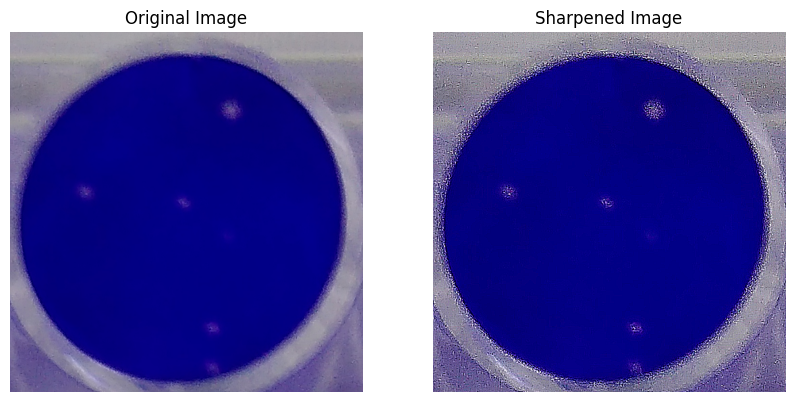

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/runs/detect/cropped_wells/IMG_20201125_125621.jpg_well_2.png'
img = cv2.imread(image_path)

if img is None:
    print(f"Error: Could not read image from {image_path}")
else:
    # Sharpen the image using a kernel
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    sharpened_img = cv2.filter2D(img, -1, kernel)

    # Display the original and sharpened images
    plt.figure(figsize=(10, 5))  # Adjust figure size for better viewing

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert to RGB for Matplotlib
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2RGB))  # Convert to RGB for Matplotlib
    plt.title('Sharpened Image')
    plt.axis('off')

    plt.show()